In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/DeepLearning/detection_fruit_projet/

Mounted at /content/drive
/content/drive/MyDrive/DeepLearning/detection_fruit_projet


In [ ]:
%ls

 0124.jpeg                                        img_1421.jpeg
 023.jpeg                                         img_1431.jpeg
 202.jpeg                                         img_161.jpeg
 321.jpeg                                         img_2501.jpeg
 99.jpeg                                          img_281.jpeg
 apple_94.jpg                                     img_3421.jpeg
 banana_77.jpg                                    img_351.jpeg
 Data_10_class/                                   img_361.jpeg
 deep_learning_fruit_classification_model.ipynb   img_711.jpeg
 fruit_classification_CNN_10_class.ipynb          img_721.jpeg
 fruit_detection_model.ipynb                      img_981.jpeg
 img_1031.jpeg                                    keras-yolo3/
 img_1101.jpeg                                    mixed_21.jpg
 img_111.jpeg                                     mobile_net_model_10_class_fruit_classification.h5
 img_1121.jpeg                                    model_fruit_classification.

#imports

In [2]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import cv2
from keras.utils import to_categorical
from keras.layers import Dense,Conv2D,Flatten,MaxPool2D,Dropout
from keras.models import Sequential
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras import layers
from tensorflow.keras.layers import *

In [3]:
train_data = '/content/drive/MyDrive/DeepLearning/detection_fruit_projet/Data_10_class/MY_data/train'
test_data = '/content/drive/MyDrive/DeepLearning/detection_fruit_projet/Data_10_class/MY_data/test'
val_data = '/content/drive/MyDrive/DeepLearning/detection_fruit_projet/Data_10_class/MY_data/predict'

#create our CNN for 10 class fruit classification


In [4]:
my_cnn_model = tf.keras.models.Sequential([
    layers.Conv2D(32, 3, activation='tanh',input_shape=(256, 256, 3)),
    layers.MaxPooling2D(4),
    layers.Conv2D(64, 3,  activation='tanh'),
    layers.MaxPooling2D(4),
    layers.Conv2D(128, 4,  activation='tanh'),
    layers.MaxPooling2D(4),
    layers.Flatten(),


    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    tf.keras.layers.Dense(10, activation='softmax')
])

my_cnn_model.compile(loss='categorical_crossentropy',
              metrics=['acc'],
              optimizer='adam')

## Mobile NET

In [ ]:
mobile_model = Sequential()

pretrained_model= tf.keras.applications.mobilenet.MobileNet(include_top=False,
                   input_shape=(224,224,3),
                   pooling='avg',classes=10,
                   weights='imagenet')
for layer in pretrained_model.layers:
        layer.trainable=False

mobile_model.add(pretrained_model)

In [ ]:
mobile_model.add(Dense(20,activation='relu'))
mobile_model.add(Dense(15,activation='relu'))
mobile_model.add(Dense(10,activation = 'softmax'))

mobile_model.compile(
              loss='categorical_crossentropy',
              metrics=['acc'],
              optimizer='adam'
             )

## Efficient NET

In [ ]:
!pip install timm

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
import time
from tqdm import tqdm
from sklearn.metrics import f1_score

In [ ]:
def make_model(lr, mod_num=3):
  img_shape = (256,256,3)
  if mod_num == 0:
      base_model=tf.keras.applications.efficientnet.EfficientNetB0(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max')
      msg='Created EfficientNet B0 model'
  elif mod_num == 3:
      base_model=tf.keras.applications.efficientnet.EfficientNetB3(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max')
      msg='Created EfficientNet B3 model'
  elif mod_num == 5:
      base_model=tf.keras.applications.efficientnet.EfficientNetB5(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max')
      msg='Created EfficientNet B5 model'

  else:
        base_model=tf.keras.applications.efficientnet.EfficientNetB7(include_top=False, weights="imagenet",input_shape=img_shape, pooling='max')
        msg='Created EfficientNet B7 model'

  base_model.trainable=True
  x=base_model.output
  x=BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001 )(x)
  x = Dense(256, kernel_regularizer = regularizers.l2(l = 0.016),activity_regularizer=regularizers.l1(0.006),
                  bias_regularizer=regularizers.l1(0.006) ,activation='relu')(x)
  x=Dropout(rate=.4, seed=123)(x)
  output=Dense(10, activation='softmax')(x)
  model=Model(inputs=base_model.input, outputs=output)
  model.compile(Adamax(learning_rate=lr), loss='categorical_crossentropy', metrics=['accuracy'])
  msg=msg + f' with initial learning rate set to {lr}'
  print(msg)
  return model

In [ ]:
lr=.001
efficient_net_model=make_model(lr) # using B3 model by default

Created EfficientNet B3 model with initial learning rate set to 0.001


#Process image data

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [6]:
TRAINING_DIR = train_data
TESTING_DIR = test_data

In [7]:
import os
classes=sorted(os.listdir(TRAINING_DIR))
",".join([f"{i}:{c}" for i,c in enumerate(classes)])

'0:Apple,1:Banana,2:avocado,3:cherry,4:kiwi,5:mango,6:orange,7:pinenapple,8:strawberries,9:watermelon'

In [8]:
train_datagen = ImageDataGenerator(
        rotation_range=15,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        width_shift_range=0.1,
        height_shift_range=0.1,
        rescale=1./255,
        validation_split=0.2
    )

In [9]:
testing_datagen = ImageDataGenerator(
        rotation_range=15,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        width_shift_range=0.1,
        height_shift_range=0.1,
        rescale=1./255
    )

In [10]:
train_generator = train_datagen.flow_from_directory(
    TRAINING_DIR,
    classes=classes,
    color_mode="rgb",
    batch_size=64,
    target_size=(224,224),
    class_mode="categorical",
    subset="training"
)

Found 1841 images belonging to 10 classes.


In [11]:
validation_generator = train_datagen.flow_from_directory(
    TRAINING_DIR,
    classes=classes,
    color_mode="rgb",
    batch_size=64,
    target_size=(224,224),
    class_mode="categorical",
    subset="validation"
)

Found 460 images belonging to 10 classes.


In [ ]:
def plot_training_validation(history):
  plt.figure(figsize=(15, 6))
  plt.subplot(121)

  plt.plot(history.history['loss'],'-r',label = 'training')
  plt.plot(history.history['val_loss'],'-b', label='Validation')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend() ,
  plt.subplot(122)
  plt.plot(history.history['acc'],'-r', label='Training')
  plt.plot(history.history['val_acc'], '-b', label='Validation')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.show()

##Train mobile-net

In [ ]:
history = mobile_model.fit(train_generator, epochs = 20,
                    validation_data = validation_generator)

Epoch 1/20
29/29 [==============================] - 150s 5s/step - loss: 2.0907 - acc: 0.2732 - val_loss: 1.7443 - val_acc: 0.4087
Epoch 2/20
29/29 [==============================] - 155s 5s/step - loss: 1.5730 - acc: 0.4655 - val_loss: 1.3324 - val_acc: 0.5848
Epoch 3/20
29/29 [==============================] - 155s 5s/step - loss: 1.1921 - acc: 0.6464 - val_loss: 1.0043 - val_acc: 0.6935
Epoch 4/20
29/29 [==============================] - 144s 5s/step - loss: 0.9102 - acc: 0.7556 - val_loss: 0.8226 - val_acc: 0.7717
Epoch 5/20
29/29 [==============================] - 152s 5s/step - loss: 0.7198 - acc: 0.8093 - val_loss: 0.6408 - val_acc: 0.8261
Epoch 6/20
29/29 [==============================] - 144s 5s/step - loss: 0.5950 - acc: 0.8354 - val_loss: 0.5480 - val_acc: 0.8348
Epoch 7/20
29/29 [==============================] - 152s 5s/step - loss: 0.5092 - acc: 0.8599 - val_loss: 0.4928 - val_acc: 0.8609
Epoch 8/20
29/29 [==============================] - 144s 5s/step - loss: 0.4452 - a

In [ ]:
%ls

apple_94.jpg                                    keras-yolo3/
banana_77.jpg                                   mixed_21.jpg
Data_10_class/                                  mobile_net_model_10_class_fruit_classification.h5
deep_learning_fruit_classification_model.ipynb  model_fruit_classification.h5
fruit_classification_CNN_10_class.ipynb         model_fruit_detection.pth
fruit_detection_model.ipynb                     test_zip/
img_141.jpeg                                    train_zip/
img_361.jpeg


In [ ]:
mobile_model.save("mobile_net_model_10_class_fruit_classification.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


## upload trained model

In [12]:
from tensorflow.keras.models import load_model

# Charger le modèle depuis le fichier h5
mobile_model = load_model('mobile_net_model_10_class_fruit_classification.h5')

In [13]:
mobile_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 1024)              3228864   
 onal)                                                           
                                                                 
 dense (Dense)               (None, 20)                20500     
                                                                 
 dense_1 (Dense)             (None, 15)                315       
                                                                 
 dense_2 (Dense)             (None, 10)                160       
                                                                 
Total params: 3249839 (12.40 MB)
Trainable params: 20975 (81.93 KB)
Non-trainable params: 3228864 (12.32 MB)
_________________________________________________________________


## train efficient net

In [ ]:
history = efficient_net_model.fit(train_generator, epochs = 20,
                    validation_data = validation_generator)

Epoch 1/20
 9/29 [========>.....................] - ETA: 10:26 - loss: 9.7894 - accuracy: 0.3767

## train my cnn model

In [ ]:
from tensorflow.keras.models import load_model

# Charger le modèle depuis le fichier h5
my_cnn_model = load_model('my_cnn_model_for_10_class.h5')

In [ ]:
history = my_cnn_model.fit(train_generator, epochs = 20,
                    validation_data = validation_generator)

Epoch 1/20
29/29 [==============================] - 172s 6s/step - loss: 2.2550 - acc: 0.1684 - val_loss: 1.9481 - val_acc: 0.3500
Epoch 2/20
29/29 [==============================] - 169s 6s/step - loss: 1.9931 - acc: 0.2618 - val_loss: 1.7678 - val_acc: 0.3696
Epoch 3/20
29/29 [==============================] - 170s 6s/step - loss: 1.8250 - acc: 0.3221 - val_loss: 1.5666 - val_acc: 0.4217
Epoch 4/20
29/29 [==============================] - 167s 6s/step - loss: 1.7118 - acc: 0.3840 - val_loss: 1.5316 - val_acc: 0.4674
Epoch 5/20
29/29 [==============================] - 167s 6s/step - loss: 1.6247 - acc: 0.3965 - val_loss: 1.4728 - val_acc: 0.4500
Epoch 6/20
29/29 [==============================] - 167s 6s/step - loss: 1.5656 - acc: 0.4155 - val_loss: 1.3315 - val_acc: 0.5000
Epoch 7/20
29/29 [==============================] - 165s 6s/step - loss: 1.5145 - acc: 0.4389 - val_loss: 1.3163 - val_acc: 0.4978
Epoch 8/20
29/29 [==============================] - 166s 6s/step - loss: 1.4893 - a

In [ ]:
my_cnn_model.save("my_cnn_model_for_10_class.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-24-55a91801e2e4>", line 1, in <cell line: 1>
    my_cnn_model.save("my_cnn_model_for_10_class.h5")
  File "/usr/local/lib/python3.10/dist-packages/keras/src/utils/traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "/usr/local/lib/python3.10/dist-packages/h5py/_hl/files.py", line 567, in __init__
    fid = make_fid(name, mode, userblock_size, fapl, fcpl, swmr=swmr)
  File "/usr/local/lib/python3.10/dist-packages/h5py/_hl/files.py", line 237, in make_fid
    fid = h5f.create(name, h5f.ACC_TRUNC, fapl=fapl, fcpl=fcpl)
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5f.pyx", line 126, in h5py.h5f.create
OSError: [Er

In [ ]:
%ls

drive/  my_cnn_model_for_10_class.h5  sample_data/


In [30]:
from google.colab import files
import io

#Upload Images to test the images

In [31]:
def upload_and_classify_image(model):
    image_upload = []
    shape = (224,224, 3)

    uploaded = files.upload()
    for filename, content in uploaded.items():
        img = cv2.imdecode(np.frombuffer(content, np.uint8), -1)
        img = cv2.resize(img, shape[:2])  # Utilise seulement la hauteur et la largeur

        image_upload.append(img)

    # Cast into numpy array
    image_upload = np.array(image_upload)

    # Faire une prédiction sur l'image
    output = model.predict(image_upload)

    # Affichage avec matplotlib
    plt.figure(figsize=(30,6))
    plt.subplot(121)
    plt.title("Input image")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')

    # Afficher les probabilités prédites avec les noms des classes
    plt.subplot(122)
    classes = ['apple', 'banana','avocado','cherry','kiwi','mango','orange','pineaple','strawberries','watermelon']
    plt.bar(range(len(classes)), output.flatten(), tick_label=classes)
    plt.title("Prediction by the model")
    plt.xlabel('Class')
    plt.ylabel('Probability')
    plt.show()

    # La classe prédite avec la probabilité maximale
    prediction = output.argmax()
    print('Predicted class:', prediction)

Saving img_1071.jpeg to img_1071 (1).jpeg
1/1 [==============================] - 0s 30ms/step


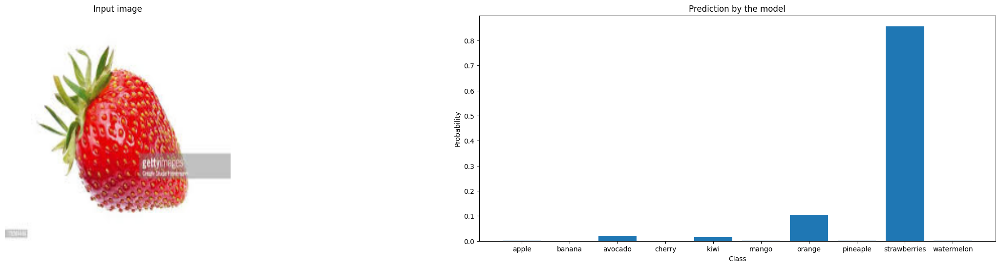

Predicted class: 8


In [36]:
# Exemple d'utilisation:
upload_and_classify_image(mobile_model)

In [ ]:
upload_and_classify_image(my_cnn_model)

#evaluate on subset validation data

2/2 [==============================] - 0s 50ms/step


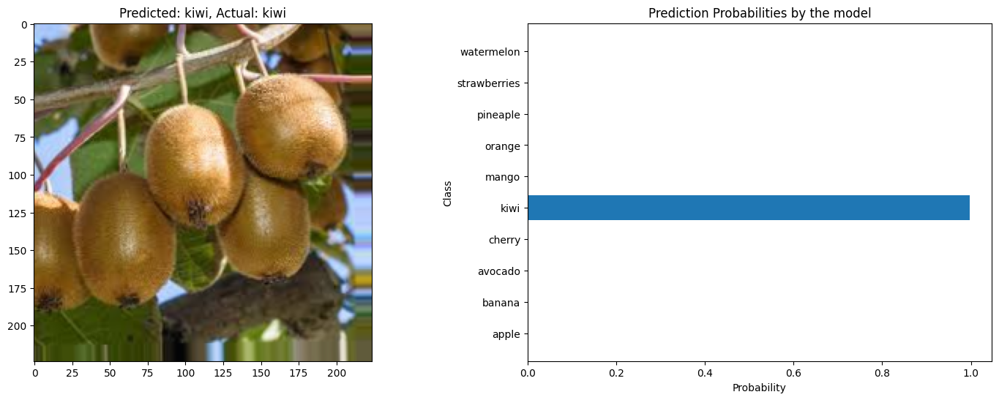

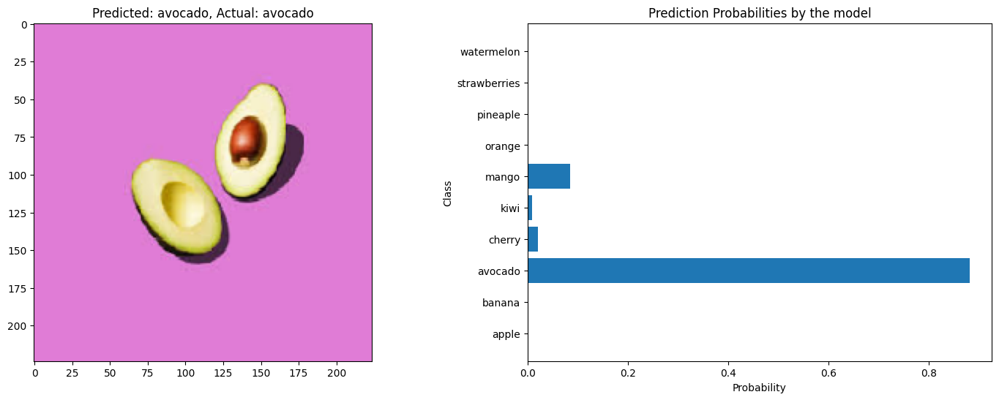

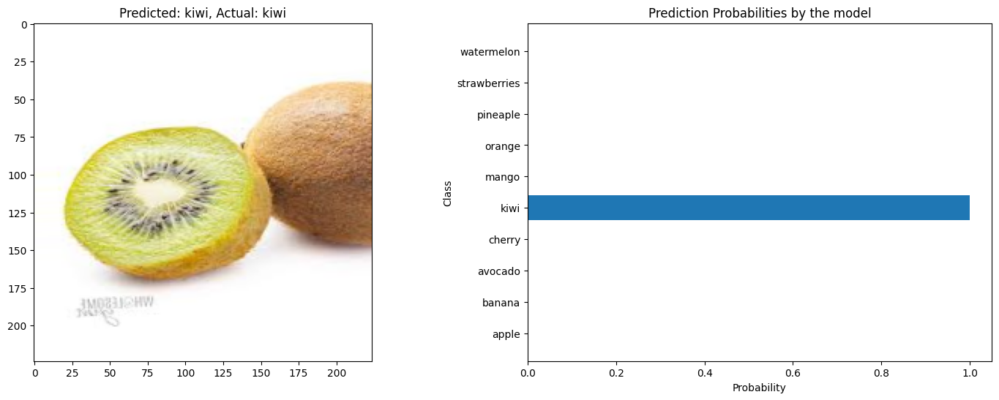

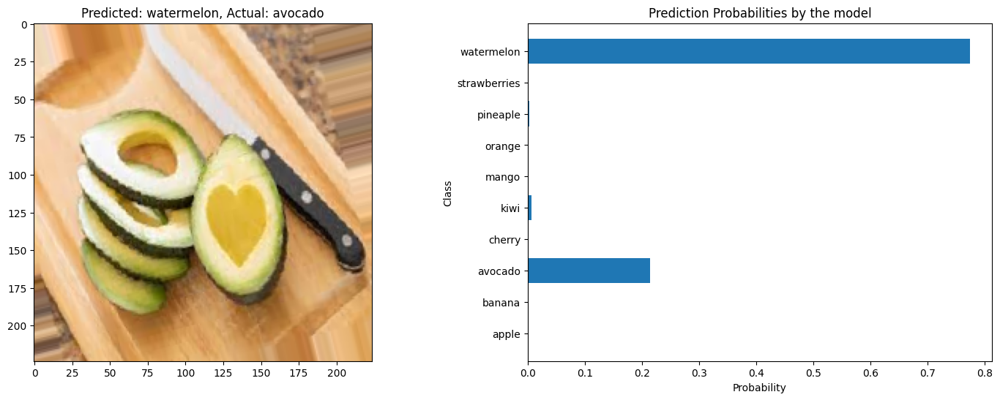

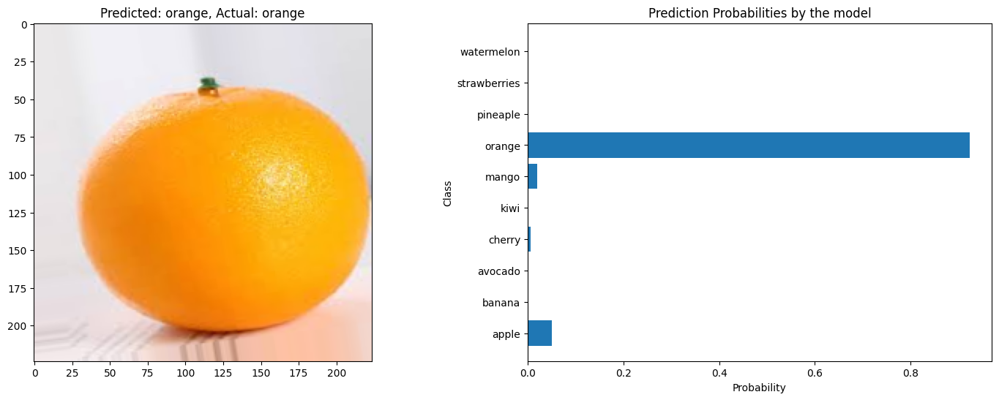

...

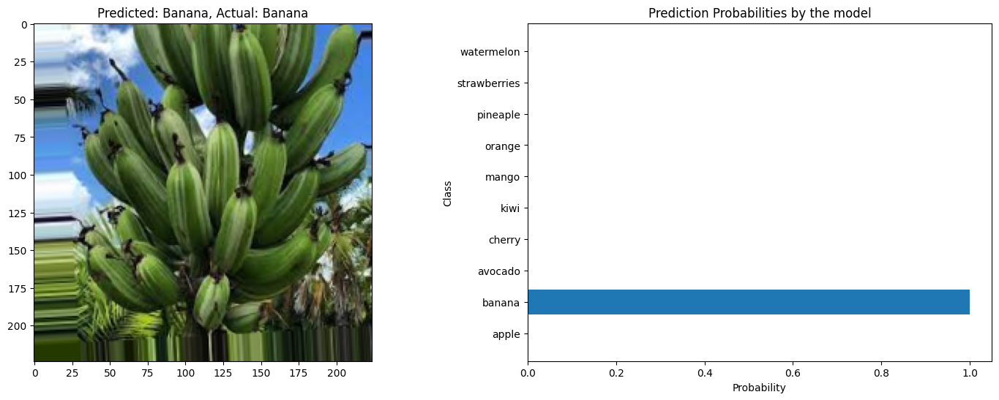

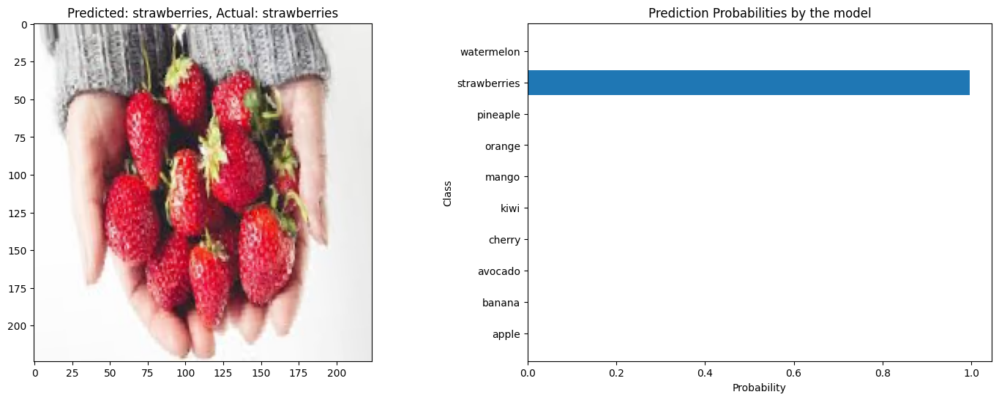

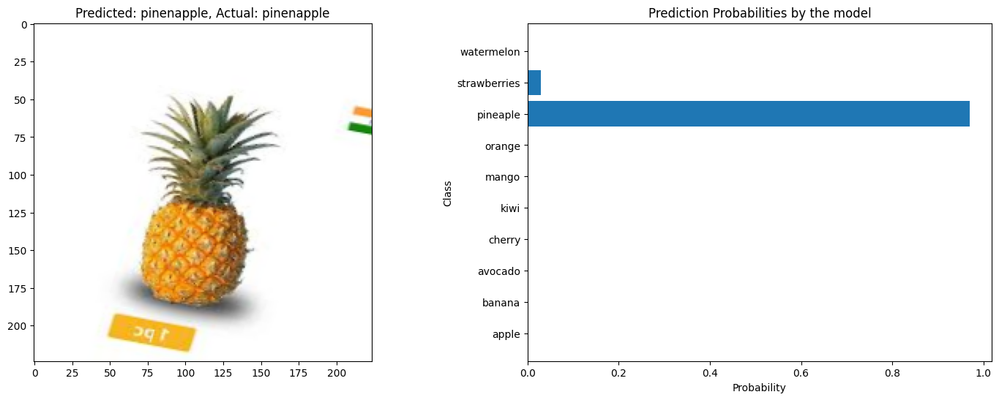

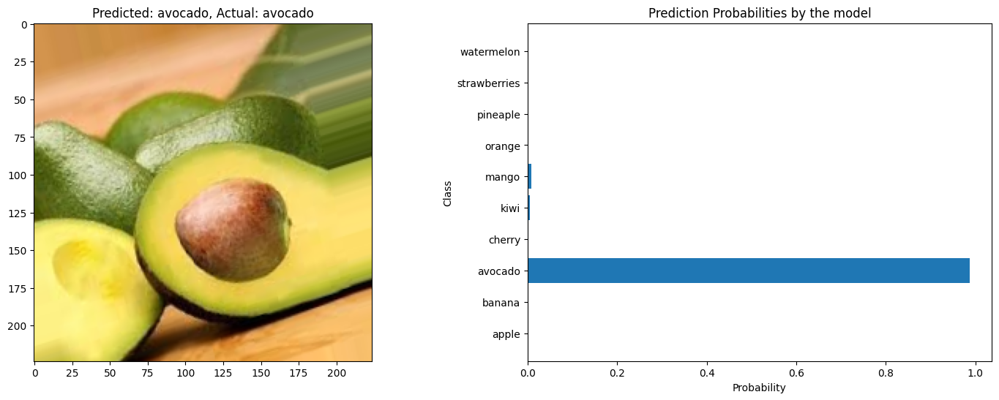

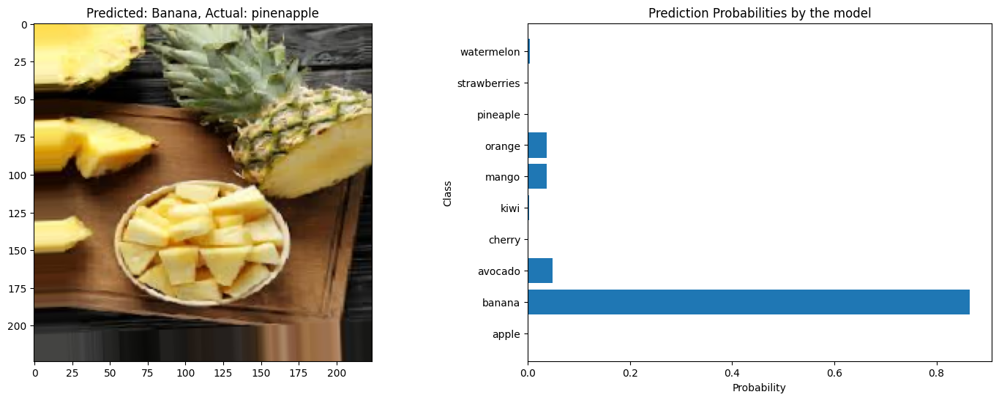

Accuracy on validation data: 90.62%


In [28]:
import numpy as np
import matplotlib.pyplot as plt
import random


# Charger les données de validation avec les vraies étiquettes
validation_data, validation_labels = next(validation_generator)

# Prédictions du modèle sur les données de validation
predictions = mobile_model.predict(validation_data)

# Convertir les indices des classes prédites en noms de classes
predicted_classes = np.argmax(predictions, axis=1)
class_names = list(validation_generator.class_indices.keys())
predicted_class_names = [class_names[i] for i in predicted_classes]

# Afficher quelques exemples avec leurs prédictions et vraies étiquettes
# Afficher quelques exemples avec leurs prédictions et vraies étiquettes
num_examples_to_display = 40

# Obtenir un échantillon aléatoire d'indices d'images
random_indices = random.sample(range(len(validation_data)), num_examples_to_display)

# Afficher quelques exemples
for i in random_indices:
    plt.figure(figsize=(18, 6))

    # Afficher l'image avec la prédiction et l'étiquette réelle
    plt.subplot(121)
    plt.imshow(validation_data[i])
    plt.title(f"Predicted: {predicted_class_names[i]}, Actual: {class_names[np.argmax(validation_labels[i])]}")

    # Afficher les probabilités prédites avec les noms des classes
    plt.subplot(122)
    classes = ['apple', 'banana', 'avocado', 'cherry', 'kiwi', 'mango', 'orange', 'pineaple', 'strawberries', 'watermelon']
    plt.barh(classes, predictions[i])
    plt.title("Prediction Probabilities by the model")
    plt.xlabel('Probability')
    plt.ylabel('Class')
    plt.show()

# Calculer l'accuracy sur l'ensemble de validation
accuracy = np.mean(np.equal(predicted_classes, np.argmax(validation_labels, axis=1)))
print("Accuracy on validation data: {:.2f}%".format(accuracy * 100))



#confusion matrix

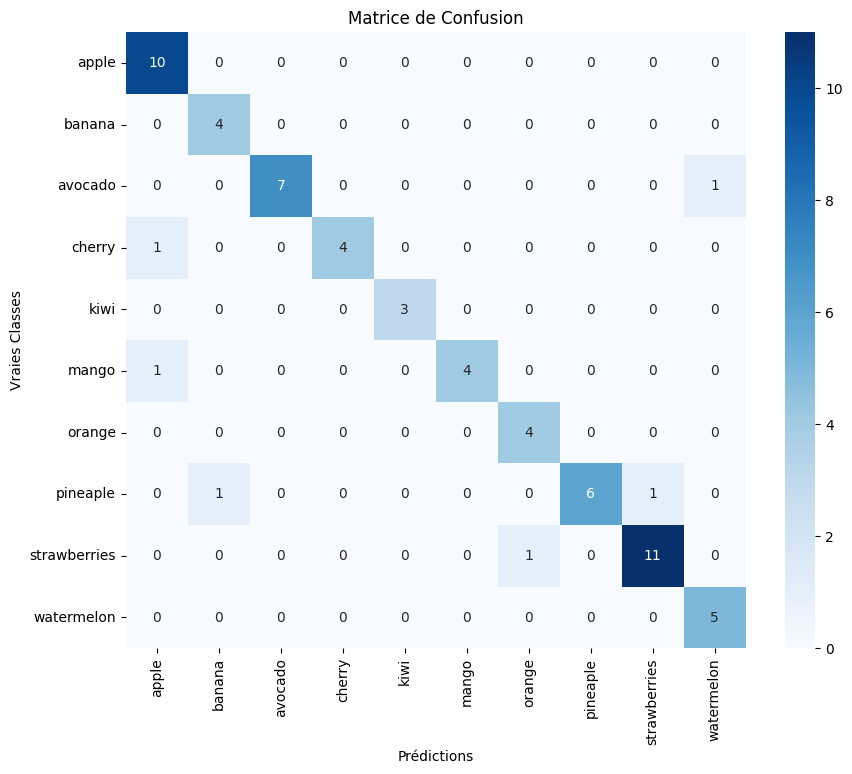

In [29]:
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Obtenir les vraies classes à partir des étiquettes de validation
true_classes = np.argmax(validation_labels, axis=1)

# Obtenir la matrice de confusion
conf_matrix = confusion_matrix(true_classes, predicted_classes)
# Créer la heatmap de la matrice de confusion
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Matrice de Confusion')
plt.xlabel('Prédictions')
plt.ylabel('Vraies Classes')
plt.show()
